# Amazon Fine Food Reviews Analysis


Data Source: https://www.kaggle.com/snap/amazon-fine-food-reviews <br>

EDA: https://nycdatascience.com/blog/student-works/amazon-fine-foods-visualization/


The Amazon Fine Food Reviews dataset consists of reviews of fine foods from Amazon.<br>

Number of reviews: 568,454<br>
Number of users: 256,059<br>
Number of products: 74,258<br>
Timespan: Oct 1999 - Oct 2012<br>
Number of Attributes/Columns in data: 10 

Attribute Information:

1. Id
2. ProductId - unique identifier for the product
3. UserId - unqiue identifier for the user
4. ProfileName
5. HelpfulnessNumerator - number of users who found the review helpful
6. HelpfulnessDenominator - number of users who indicated whether they found the review helpful or not
7. Score - rating between 1 and 5
8. Time - timestamp for the review
9. Summary - brief summary of the review
10. Text - text of the review


#### Objective:
Given a review, determine whether the review is positive (rating of 4 or 5) or negative (rating of 1 or 2).

<br>
[Q] How to determine if a review is positive or negative?<br>
<br> 
[Ans] We could use Score/Rating. A rating of 4 or 5 can be cosnidered as a positive review. A rating of 1 or 2 can be considered as negative one. A review of rating 3 is considered nuetral and such reviews are ignored from our analysis. This is an approximate and proxy way of determining the polarity (positivity/negativity) of a review.




# [1]. Reading Data

## [1.1] Loading the data

The dataset is available in two forms
1. .csv file
2. SQLite Database

In order to load the data, We have used the SQLITE dataset as it is easier to query the data and visualise the data efficiently.
<br> 

Here as we only want to get the global sentiment of the recommendations (positive or negative), we will purposefully ignore all Scores equal to 3. If the score is above 3, then the recommendation wil be set to "positive". Otherwise, it will be set to "negative".

In [1]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")


import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os

In [2]:
# using SQLite Table to read data.
con = sqlite3.connect('database.sqlite') 

# filtering only positive and negative reviews i.e. 
# not taking into consideration those reviews with Score=3
# SELECT * FROM Reviews WHERE Score != 3 LIMIT 500000, will give top 500000 data points
# you can change the number to any other number based on your computing power

# filtered_data = pd.read_sql_query(""" SELECT * FROM Reviews WHERE Score != 3 LIMIT 500000""", con) 
# for tsne assignment you can take 5k data points

filtered_data = pd.read_sql_query(""" SELECT * FROM Reviews WHERE Score != 3 LIMIT 100000""", con) 

# Give reviews with Score>3 a positive rating(1), and reviews with a score<3 a negative rating(0).
def partition(x):
    if x < 3:
        return 0
    return 1

#changing reviews with score less than 3 to be positive and vice-versa
actualScore = filtered_data['Score']
positiveNegative = actualScore.map(partition) 
filtered_data['Score'] = positiveNegative
print("Number of data points in our data", filtered_data.shape)
filtered_data.head(3)

Number of data points in our data (100000, 10)


,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,1,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,0,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,1,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...


In [3]:
display = pd.read_sql_query("""
SELECT UserId, ProductId, ProfileName, Time, Score, Text, COUNT(*)
FROM Reviews
GROUP BY UserId
HAVING COUNT(*)>1
""", con)

In [4]:
print(display.shape)
display.head()

(80668, 7)


,UserId,ProductId,ProfileName,Time,Score,Text,COUNT(*)
0,#oc-R115TNMSPFT9I7,B005ZBZLT4,Breyton,1331510400,2,Overall its just OK when considering the price...,2
1,#oc-R11D9D7SHXIJB9,B005HG9ESG,"Louis E. Emory ""hoppy""",1342396800,5,"My wife has recurring extreme muscle spasms, u...",3
2,#oc-R11DNU2NBKQ23Z,B005ZBZLT4,Kim Cieszykowski,1348531200,1,This coffee is horrible and unfortunately not ...,2
3,#oc-R11O5J5ZVQE25C,B005HG9ESG,Penguin Chick,1346889600,5,This will be the bottle that you grab from the...,3
4,#oc-R12KPBODL2B5ZD,B007OSBEV0,Christopher P. Presta,1348617600,1,I didnt like this coffee. Instead of telling y...,2


In [5]:
display[display['UserId']=='AZY10LLTJ71NX']

,UserId,ProductId,ProfileName,Time,Score,Text,COUNT(*)
80638,AZY10LLTJ71NX,B001ATMQK2,"undertheshrine ""undertheshrine""",1296691200,5,I bought this 6 pack because for the price tha...,5


In [6]:
display['COUNT(*)'].sum()

393063

#  [2] Exploratory Data Analysis

## [2.1] Data Cleaning: Deduplication

It is observed (as shown in the table below) that the reviews data had many duplicate entries. Hence it was necessary to remove duplicates in order to get unbiased results for the analysis of the data.  Following is an example:

In [7]:
display= pd.read_sql_query("""
SELECT *
FROM Reviews
WHERE Score != 3 AND UserId="AR5J8UI46CURR"
ORDER BY ProductID
""", con)
display.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,78445,B000HDL1RQ,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
1,138317,B000HDOPYC,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
2,138277,B000HDOPYM,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
3,73791,B000HDOPZG,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
4,155049,B000PAQ75C,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...


As it can be seen above that same user has multiple reviews with same values for HelpfulnessNumerator, HelpfulnessDenominator, Score, Time, Summary and Text and on doing analysis it was found that <br>
<br> 
ProductId=B000HDOPZG was Loacker Quadratini Vanilla Wafer Cookies, 8.82-Ounce Packages (Pack of 8)<br>
<br> 
ProductId=B000HDL1RQ was Loacker Quadratini Lemon Wafer Cookies, 8.82-Ounce Packages (Pack of 8) and so on<br>

It was inferred after analysis that reviews with same parameters other than ProductId belonged to the same product just having different flavour or quantity. Hence in order to reduce redundancy it was decided to eliminate the rows having same parameters.<br>

The method used for the same was that we first sort the data according to ProductId and then just keep the first similar product review and delelte the others. for eg. in the above just the review for ProductId=B000HDL1RQ remains. This method ensures that there is only one representative for each product and deduplication without sorting would lead to possibility of different representatives still existing for the same product.

In [8]:
#Sorting data according to ProductId in ascending order
sorted_data=filtered_data.sort_values('ProductId', axis=0, ascending=True, inplace=False, kind='quicksort', na_position='last')

In [9]:


#Deduplication of entries
final=sorted_data.drop_duplicates(subset={"UserId","ProfileName","Time","Text"}, keep='first', inplace=False)
final.shape

(87775, 10)

In [10]:
#Checking to see how much % of data still remains
(final['Id'].size*1.0)/(filtered_data['Id'].size*1.0)*100

87.775

<b>Observation:-</b> It was also seen that in two rows given below the value of HelpfulnessNumerator is greater than HelpfulnessDenominator which is not practically possible hence these two rows too are removed from calcualtions

In [11]:
display= pd.read_sql_query("""
SELECT *
FROM Reviews
WHERE Score != 3 AND Id=44737 OR Id=64422
ORDER BY ProductID
""", con)

display.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,64422,B000MIDROQ,A161DK06JJMCYF,"J. E. Stephens ""Jeanne""",3,1,5,1224892800,Bought This for My Son at College,My son loves spaghetti so I didn't hesitate or...
1,44737,B001EQ55RW,A2V0I904FH7ABY,Ram,3,2,4,1212883200,Pure cocoa taste with crunchy almonds inside,It was almost a 'love at first bite' - the per...


In [12]:
final=final[final.HelpfulnessNumerator<=final.HelpfulnessDenominator]

In [13]:
#Before starting the next phase of preprocessing lets see the number of entries left
print(final.shape)

#How many positive and negative reviews are present in our dataset?
final['Score'].value_counts()

(87773, 10)


1    73592
0    14181
Name: Score, dtype: int64

In [14]:
final=final.sort_values('Time')

In [36]:
index=np.arange(87773)

In [37]:
final.index=index

In [46]:
length=[]
for i in range(87773):
    length.append(len(final.Text[i].split()))

In [51]:
final['Length']=length

In [52]:
x=final.drop('Score',axis=1)
y=final.filter(['Score'],axis=1)

In [53]:
x_tr=x[0:43008]
y_tr=y[0:43008]

x_cv=x[43008:61441]
y_cv=y[43008:61441]

x_test=x[61441:]
y_test=y[61441:]


#  [3] Preprocessing

## [3.1].  Preprocessing Review Text

Now that we have finished deduplication our data requires some preprocessing before we go on further with analysis and making the prediction model.

Hence in the Preprocessing phase we do the following in the order below:-

1. Begin by removing the html tags
2. Remove any punctuations or limited set of special characters like , or . or # etc.
3. Check if the word is made up of english letters and is not alpha-numeric
4. Check to see if the length of the word is greater than 2 (as it was researched that there is no adjective in 2-letters)
5. Convert the word to lowercase
6. Remove Stopwords
7. Finally Snowball Stemming the word (it was obsereved to be better than Porter Stemming)<br>

After which we collect the words used to describe positive and negative reviews

In [18]:
# printing some random reviews
sent_0 = final['Text'].values[0]
print(sent_0)
print("="*50)

sent_1000 = final['Text'].values[1000]
print(sent_1000)
print("="*50)

sent_1500 = final['Text'].values[1500]
print(sent_1500)
print("="*50)

sent_4900 = final['Text'].values[4900]
print(sent_4900)
print("="*50)

I bought a few of these after my apartment was infested with fruit flies. After only a few hours, the trap had &quot;attracted&quot; many flies and within a few days they were practically gone. This may not be a long term  solution, but if flies are driving you crazy, consider buying this. One  caution- the surface is very sticky, so try to avoid touching it.
I have made these brownies for family and for a den of cub scouts and no one would have known they were gluten free and everyone asked for seconds!  These brownies have a fudgy texture and have bits of chocolate chips in them which are delicious.  I would say the mix is very thick and a little difficult to work with.  The cooked brownies are slightly difficult to cut into very neat edges as the edges tend to crumble a little and I would also say that they make a slightly thinner layer of brownies than most of the store brand gluten containing but they taste just as good, if not better.  Highly recommended!<br /><br />(For those wo

In [19]:
# remove urls from text python: https://stackoverflow.com/a/40823105/4084039
sent_0 = re.sub(r"http\S+", "", sent_0)
sent_1000 = re.sub(r"http\S+", "", sent_1000)
sent_150 = re.sub(r"http\S+", "", sent_1500)
sent_4900 = re.sub(r"http\S+", "", sent_4900)

print(sent_0)

I bought a few of these after my apartment was infested with fruit flies. After only a few hours, the trap had &quot;attracted&quot; many flies and within a few days they were practically gone. This may not be a long term  solution, but if flies are driving you crazy, consider buying this. One  caution- the surface is very sticky, so try to avoid touching it.


In [20]:
# https://stackoverflow.com/questions/16206380/python-beautifulsoup-how-to-remove-all-tags-from-an-element
from bs4 import BeautifulSoup

soup = BeautifulSoup(sent_0, 'lxml')
text = soup.get_text()
print(text)
print("="*50)

soup = BeautifulSoup(sent_1000, 'lxml')
text = soup.get_text()
print(text)
print("="*50)

soup = BeautifulSoup(sent_1500, 'lxml')
text = soup.get_text()
print(text)
print("="*50)

soup = BeautifulSoup(sent_4900, 'lxml')
text = soup.get_text()
print(text)

I bought a few of these after my apartment was infested with fruit flies. After only a few hours, the trap had "attracted" many flies and within a few days they were practically gone. This may not be a long term  solution, but if flies are driving you crazy, consider buying this. One  caution- the surface is very sticky, so try to avoid touching it.
I have made these brownies for family and for a den of cub scouts and no one would have known they were gluten free and everyone asked for seconds!  These brownies have a fudgy texture and have bits of chocolate chips in them which are delicious.  I would say the mix is very thick and a little difficult to work with.  The cooked brownies are slightly difficult to cut into very neat edges as the edges tend to crumble a little and I would also say that they make a slightly thinner layer of brownies than most of the store brand gluten containing but they taste just as good, if not better.  Highly recommended!(For those wondering, this mix requ

In [21]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [22]:
sent_1500 = decontracted(sent_1500)
print(sent_1500)
print("="*50)

This gum is my absolute favorite. By purchasing on amazon I can get the savings of large quanities at a very good price. I highly recommend to all gum chewers. Plus as you enjoy the peppermint flavor and freshing of breath you are whitening your teeth all at the same time.


In [23]:
#remove words with numbers python: https://stackoverflow.com/a/18082370/4084039
sent_0 = re.sub("\S*\d\S*", "", sent_0).strip()
print(sent_0)

I bought a few of these after my apartment was infested with fruit flies. After only a few hours, the trap had &quot;attracted&quot; many flies and within a few days they were practically gone. This may not be a long term  solution, but if flies are driving you crazy, consider buying this. One  caution- the surface is very sticky, so try to avoid touching it.


In [24]:
#remove spacial character: https://stackoverflow.com/a/5843547/4084039
sent_1500 = re.sub('[^A-Za-z0-9]+', ' ', sent_1500)
print(sent_1500)

This gum is my absolute favorite By purchasing on amazon I can get the savings of large quanities at a very good price I highly recommend to all gum chewers Plus as you enjoy the peppermint flavor and freshing of breath you are whitening your teeth all at the same time 


In [25]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
# <br /><br /> ==> after the above steps, we are getting "br br"
# we are including them into stop words list
# instead of <br /> if we have <br/> these tags would have revmoved in the 1st step

stopwords= set(['br', 'the', 'i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"])

In [30]:
# Combining all the above stundents 
def prepro(x):
    # Combining all the above stundents 
    from tqdm import tqdm
    preprocessed_reviews = []
    # tqdm is for printing the status bar
    for sentance in tqdm(x['Text'].values):
        sentance = re.sub(r"http\S+", "", sentance)
        sentance = BeautifulSoup(sentance, 'lxml').get_text()
        sentance = decontracted(sentance)
        sentance = re.sub("\S*\d\S*", "", sentance).strip()
        sentance = re.sub('[^A-Za-z]+', ' ', sentance)
        # https://gist.github.com/sebleier/554280
        sentance = ' '.join(e.lower() for e in sentance.split() if e.lower() not in stopwords)
        preprocessed_reviews.append(sentance.strip())
    return preprocessed_reviews
def preprosum(x):
    # Combining all the above stundents 
    from tqdm import tqdm
    preprocessed_reviews = []
    # tqdm is for printing the status bar
    for sentance in tqdm(x['Summary'].values):
        sentance = re.sub(r"http\S+", "", sentance)
        sentance = BeautifulSoup(sentance, 'lxml').get_text()
        sentance = decontracted(sentance)
        sentance = re.sub("\S*\d\S*", "", sentance).strip()
        sentance = re.sub('[^A-Za-z]+', ' ', sentance)
        # https://gist.github.com/sebleier/554280
        sentance = ' '.join(e.lower() for e in sentance.split() if e.lower() not in stopwords)
        preprocessed_reviews.append(sentance.strip())
    return preprocessed_reviews

In [27]:
prepro_tr=prepro(x_tr)

100%|██████████████████████████████████████████████████████████████████████████| 43008/43008 [00:16<00:00, 2564.50it/s]


In [28]:
prepro_cv=prepro(x_cv)

100%|██████████████████████████████████████████████████████████████████████████| 18433/18433 [00:06<00:00, 2699.33it/s]


In [29]:
prepro_test=prepro(x_test)

100%|██████████████████████████████████████████████████████████████████████████| 26332/26332 [00:09<00:00, 2676.85it/s]


In [58]:
prepro_tr_sum=preprosum(x_tr)

  4%|███▏                                                                       | 1856/43008 [00:00<00:11, 3728.10it/s]C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\bs4\__init__.py:273: UserWarning: "b'...'" looks like a filename, not markup. You should probably open this file and pass the filehandle into Beautiful Soup.
  ' Beautiful Soup.' % markup)
 88%|█████████████████████████████████████████████████████████████████▏        | 37894/43008 [00:10<00:01, 3694.85it/s]C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\bs4\__init__.py:273: UserWarning: "b'...'" looks like a filename, not markup. You should probably open this file and pass the filehandle into Beautiful Soup.
  ' Beautiful Soup.' % markup)
100%|██████████████████████████████████████████████████████████████████████████| 43008/43008 [00:11<00:00, 3720.44it/s]


In [59]:
prepro_cv_sum=preprosum(x_cv)

 33%|████████████████████████▋                                                  | 6069/18433 [00:01<00:03, 3813.95it/s]C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\bs4\__init__.py:273: UserWarning: "b'...'" looks like a filename, not markup. You should probably open this file and pass the filehandle into Beautiful Soup.
  ' Beautiful Soup.' % markup)
100%|██████████████████████████████████████████████████████████████████████████| 18433/18433 [00:04<00:00, 3694.45it/s]


In [60]:
prepro_test_sum=preprosum(x_test)

 41%|██████████████████████████████▌                                           | 10868/26332 [00:02<00:04, 3684.32it/s]C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\bs4\__init__.py:273: UserWarning: "b'...'" looks like a filename, not markup. You should probably open this file and pass the filehandle into Beautiful Soup.
  ' Beautiful Soup.' % markup)
100%|██████████████████████████████████████████████████████████████████████████| 26332/26332 [00:07<00:00, 3720.72it/s]


# Featurization

### BAG OF WORDS

### [1] REVIEW TEXT ONLY


### FOR TRAIN DATA

In [183]:
#BoW
count_vect = CountVectorizer() #in scikit-learn
count_vect.fit(prepro_tr)
print("some feature names ", count_vect.get_feature_names()[:10])
print('='*50)

final_counts = count_vect.fit_transform(prepro_tr)
print("the type of count vectorizer ",type(final_counts))
print("the shape of out text BOW vectorizer ",final_counts.get_shape())
print("the number of unique words ", final_counts.get_shape()[1])

some feature names  ['aa', 'aaa', 'aaaa', 'aaaaaaaaaaaaaaa', 'aaaaaaarrrrrggghhh', 'aaaaah', 'aaaah', 'aaaand', 'aachen', 'aadp']
the type of count vectorizer  <class 'scipy.sparse.csr.csr_matrix'>
the shape of out text BOW vectorizer  (43008, 38756)
the number of unique words  38756


### FOR CV DATA

In [184]:
#BoW
final_counts_cv = count_vect.transform(prepro_cv)
print("the type of count vectorizer ",type(final_counts_cv))
print("the shape of out text BOW vectorizer ",final_counts_cv.get_shape())
print("the number of unique words ", final_counts_cv.get_shape()[1])

the type of count vectorizer  <class 'scipy.sparse.csr.csr_matrix'>
the shape of out text BOW vectorizer  (18433, 38756)
the number of unique words  38756


### FOR TEST DATA

In [185]:
#BoW

final_counts_test = count_vect.transform(prepro_test)
print("the type of count vectorizer ",type(final_counts_test))
print("the shape of out text BOW vectorizer ",final_counts_test.get_shape())
print("the number of unique words ", final_counts_test.get_shape()[1])

the type of count vectorizer  <class 'scipy.sparse.csr.csr_matrix'>
the shape of out text BOW vectorizer  (26332, 38756)
the number of unique words  38756


In [38]:
len(count_vect.get_feature_names())

38756

In [38]:
len(count_vect.get_feature_names())

38756

### [5.1.1] Applying Random Forests on BOW,<font color='red'> SET 1</font>

In [64]:
from sklearn.ensemble import RandomForestClassifier as rfc
import seaborn as sns

In [65]:
auc_cv=[]
tpr_cv=[]
fpr_cv=[]
tpr_tr=[]
fpr_tr=[]
auc_tr=[]
data_rec=[]
data_rec=[]
hypermeter=[]
n_est = [5, 10, 50, 100, 200, 500, 1000]
max_dep = [2, 3, 5, 7,10, 12, 15, 20]
for i in n_est:
    for j in max_dep:
        clf=rfc(n_estimators=i,max_depth=j)
        clf.fit(final_counts,y_tr)
        pred = clf.predict_proba(final_counts_cv)[:,1]
        fpr, tpr, thresholds = metrics.roc_curve(y_cv, pred)
        auc=metrics.auc(fpr, tpr)
        auc_cv.append(auc)
        tpr_cv.append(tpr)
        fpr_cv.append(fpr)

        # predict the response on the train
        pred = clf.predict_proba(final_counts)[:,1]
        fpr, tpr, thresholds = metrics.roc_curve(y_tr, pred)
        auc=metrics.auc(fpr, tpr)
        auc_tr.append(auc)
        tpr_tr.append(tpr)
        fpr_tr.append(fpr)
        hypermeter.append([i,j])
        print(i,j)

C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


5 2


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


5 3


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


5 5


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


5 7


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


5 10


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


5 12


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


5 15


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


5 20


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


10 2


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


10 3


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


10 5


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


10 7


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


10 10


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


10 12


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


10 15


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


10 20


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


50 2


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


50 3


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


50 5


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


50 7


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


50 10


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


50 12


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


50 15


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


50 20


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


100 2


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


100 3


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


100 5


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


100 7


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


100 10


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


100 12


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


100 15


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


100 20


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


200 2


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


200 3


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


200 5


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


200 7


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


200 10


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


200 12


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


200 15


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


200 20


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


500 2


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


500 3


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


500 5


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


500 7


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


500 10


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


500 12


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


500 15


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


500 20


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


1000 2


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


1000 3


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


1000 5


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


1000 7


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


1000 10


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


1000 12


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


1000 15


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  from ipykernel import kernelapp as app


1000 20


In [66]:
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
import numpy as np

In [38]:
len(count_vect.get_feature_names())

38756

In [38]:
len(count_vect.get_feature_names())

38756

In [67]:
dep=[]
n_est=[]
for i in range(len(hypermeter)):
    n_est.append(hypermeter[i][0])
    dep.append(hypermeter[i][1])  

In [68]:
data1={'n_est':n_est,'dep':dep,'auc_cv':auc_cv[:],'auc_tr':auc_tr[:]}
data_f=pd.DataFrame(data1)

<h1>N_ESTIMATORS VS MAX_DEPTH</h1>

#### FOR TRAIN 

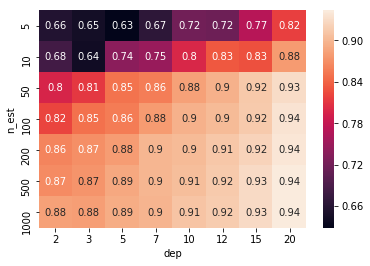

In [69]:
plo = data_f.pivot("n_est", "dep", "auc_tr");ax = sns.heatmap(plo, annot=True)

<h4 color='red'>FOR CV</h4>

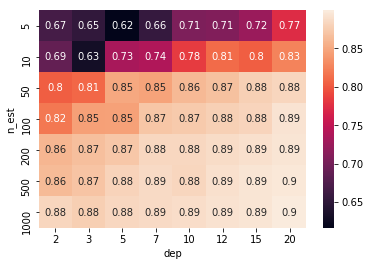

In [70]:
plo = data_f.pivot("n_est", "dep", "auc_cv");ax = sns.heatmap(plo, annot=True)

In [186]:
# TESTING THE MODEL ON TEST DATA

clf_final = rfc(n_estimators=100,max_depth=20)
clf_final.fit(final_counts, y_tr)
pred_final = clf_final.predict_proba(final_counts_test)[:,1]
fpr_f, tpr_f, thresholds_f = metrics.roc_curve(y_test, pred_final)
auc_final = metrics.auc(fpr_f, tpr_f)
auc_final

C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



0.8898103597573987

In [187]:
# TESTING THE MODEL ON TRAIN DATA

pred_train=clf_final.predict_proba(final_counts)[:,1]
fpr_ft, tpr_ft, thresholds_ft=metrics.roc_curve(y_tr, pred_train)
auc_finalt=metrics.auc(fpr_ft, tpr_ft)
auc_finalt

0.935874984114528

### ROC CURVE

In [188]:
y_a=[0,0.5,1]
x_a=y_a

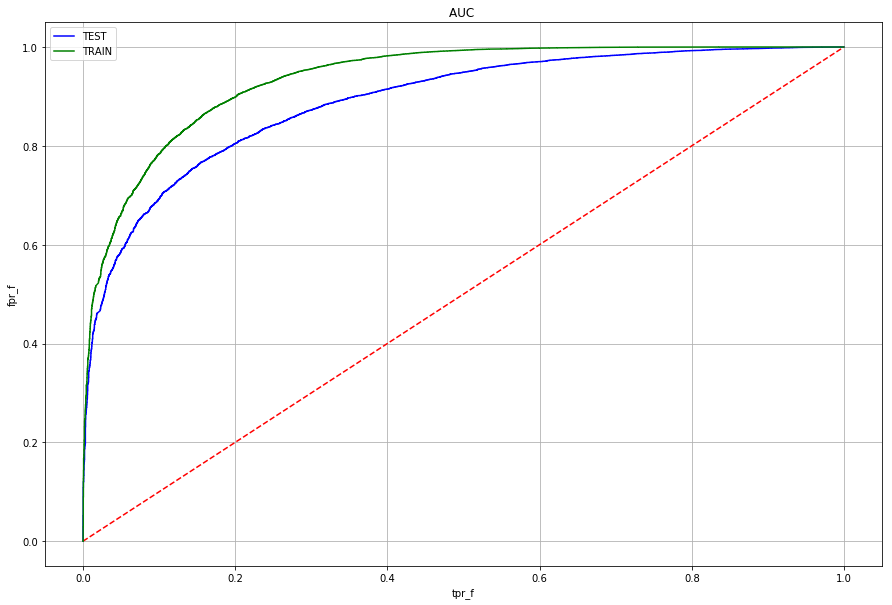

In [189]:
plt.figure(figsize=(15,10))
plt.plot(fpr_f,tpr_f,'b',label='TEST')
plt.plot(x_a,y_a,'--r')
plt.plot(fpr_ft,tpr_ft,'g',label='TRAIN')
plt.xlabel('tpr_f')
plt.ylabel('fpr_f')
plt.title('AUC ')
plt.grid()
plt.legend()
plt.show()

### CONFUSION MATRIX

In [190]:
pred_final
pred_train
pred_final_classte=[]
pred_final_classtr=[]
for i in range(len(pred_final)):
    if pred_final[i]>0.5:
        pred_final_classte.append(1)
    elif pred_final[i]<=0.5:
            pred_final_classte.append(0)
for i in range(len(pred_train)):
    if pred_train[i]>0.5:
        pred_final_classtr.append(1)
    elif pred_train[i]<=0.5:
            pred_final_classtr.append(0)

### TEST

In [191]:
cm = confusion_matrix(y_test, pred_final_classte)
cm

array([[    2,  4555],
       [    0, 21775]], dtype=int64)

In [192]:
y_test["Score"].value_counts()

1    21775
0     4557
Name: Score, dtype: int64

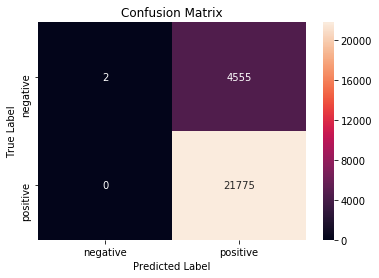

In [193]:
import seaborn as sns
class_label = ["negative", "positive"]
df_cm = pd.DataFrame(cm, index = class_label, columns = class_label)
sns.heatmap(df_cm, annot = True, fmt = "d")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

### TRAIN

In [194]:
cm = confusion_matrix(y_tr, pred_final_classtr)
cm

array([[   50,  6309],
       [    0, 36649]], dtype=int64)

In [195]:
y_tr["Score"].value_counts()

1    36649
0     6359
Name: Score, dtype: int64

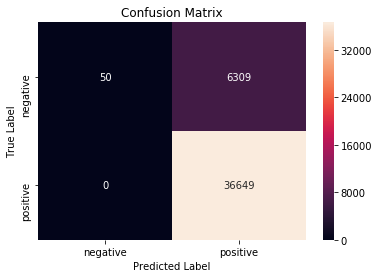

In [196]:
import seaborn as sns
class_label = ["negative", "positive"]
df_cm = pd.DataFrame(cm, index = class_label, columns = class_label)
sns.heatmap(df_cm, annot = True, fmt = "d")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

## CONCLUSION

In [197]:
from sklearn.metrics import classification_report
print(classification_report(y_test, pred_final_classte))

              precision    recall  f1-score   support

           0       1.00      0.00      0.00      4557
           1       0.83      1.00      0.91     21775

   micro avg       0.83      0.83      0.83     26332
   macro avg       0.91      0.50      0.45     26332
weighted avg       0.86      0.83      0.75     26332



### [2] SUMMARY TEXT  

In [198]:
#BoW
count_vect = CountVectorizer() #in scikit-learn
count_vect.fit(prepro_tr_sum)
print("some feature names ", count_vect.get_feature_names()[:10])
print('='*50)

final_counts = count_vect.fit_transform(prepro_tr_sum)
print("the type of count vectorizer ",type(final_counts))
print("the shape of out text BOW vectorizer ",final_counts.get_shape())
print("the number of unique words ", final_counts.get_shape()[1])

some feature names  ['aa', 'aaa', 'aaaaaaaaaaaa', 'aaaaaagh', 'aaaarrrrrgggghhhhh', 'abbey', 'abi', 'able', 'abolutely', 'abomination']
the type of count vectorizer  <class 'scipy.sparse.csr.csr_matrix'>
the shape of out text BOW vectorizer  (43008, 10170)
the number of unique words  10170


### FOR CV DATA

In [199]:
#BoW
final_counts_cv = count_vect.transform(prepro_cv_sum)
print("the type of count vectorizer ",type(final_counts_cv))
print("the shape of out text BOW vectorizer ",final_counts_cv.get_shape())
print("the number of unique words ", final_counts_cv.get_shape()[1])

the type of count vectorizer  <class 'scipy.sparse.csr.csr_matrix'>
the shape of out text BOW vectorizer  (18433, 10170)
the number of unique words  10170


### FOR TEST DATA

In [200]:
#BoW

final_counts_test = count_vect.transform(prepro_test_sum)
print("the type of count vectorizer ",type(final_counts_test))
print("the shape of out text BOW vectorizer ",final_counts_test.get_shape())
print("the number of unique words ", final_counts_test.get_shape()[1])

the type of count vectorizer  <class 'scipy.sparse.csr.csr_matrix'>
the shape of out text BOW vectorizer  (26332, 10170)
the number of unique words  10170


### Applying Random Forests on BOW

In [87]:
from sklearn.ensemble import RandomForestClassifier as rfc
import seaborn as sns

In [88]:
auc_cv=[]
tpr_cv=[]
fpr_cv=[]
tpr_tr=[]
fpr_tr=[]
auc_tr=[]
data_rec=[]
data_rec=[]
hypermeter=[]
n_est = [5, 10, 50, 100, 200, 500, 1000]
max_dep = [2, 3, 5, 7,10, 12, 15, 20]
for i in n_est:
    for j in max_dep:
        clf=rfc(n_estimators=i,max_depth=j)
        clf.fit(final_counts,y_tr)
        pred = clf.predict_proba(final_counts_cv)[:,1]
        fpr, tpr, thresholds = metrics.roc_curve(y_cv, pred)
        auc=metrics.auc(fpr, tpr)
        auc_cv.append(auc)
        tpr_cv.append(tpr)
        fpr_cv.append(fpr)

        # predict the response on the train
        pred = clf.predict_proba(final_counts)[:,1]
        fpr, tpr, thresholds = metrics.roc_curve(y_tr, pred)
        auc=metrics.auc(fpr, tpr)
        auc_tr.append(auc)
        tpr_tr.append(tpr)
        fpr_tr.append(fpr)
        hypermeter.append([i,j])
        print(i,j)

C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



5 2


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



5 3


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



5 5


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



5 7


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



5 10


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



5 12


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



5 15


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



5 20


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



10 2


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



10 3


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



10 5


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



10 7


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



10 10


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



10 12


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



10 15


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



10 20


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



50 2


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



50 3


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



50 5


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



50 7


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



50 10


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



50 12


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



50 15


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



50 20


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



100 2


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



100 3


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



100 5


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



100 7


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



100 10


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



100 12


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



100 15


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



100 20


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



200 2


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



200 3


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



200 5


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



200 7


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



200 10


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



200 12


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



200 15


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



200 20


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



500 2


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



500 3


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



500 5


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



500 7


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



500 10


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



500 12


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



500 15


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



500 20


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



1000 2


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



1000 3


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



1000 5


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



1000 7


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



1000 10


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



1000 12


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



1000 15


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



1000 20


In [89]:
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
import numpy as np

In [90]:
dep=[]
n_est=[]
for i in range(len(hypermeter)):
    n_est.append(hypermeter[i][0])
    dep.append(hypermeter[i][1])  

In [91]:
data1={'n_est':n_est,'dep':dep,'auc_cv':auc_cv[:],'auc_tr':auc_tr[:]}
data_f=pd.DataFrame(data1)

<h1>N_ESTIMATORS VS MAX_DEPTH</h1>

#### FOR TRAIN 

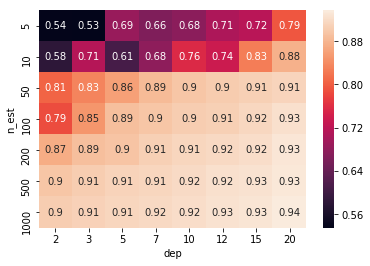

In [92]:
plo = data_f.pivot("n_est", "dep", "auc_tr");ax = sns.heatmap(plo, annot=True)

<h4 color='red'>FOR CV</h4>

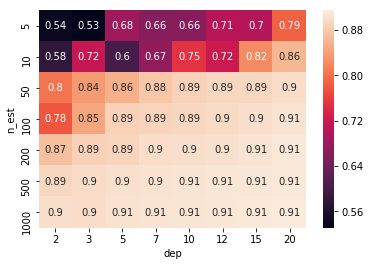

In [93]:
plo = data_f.pivot("n_est", "dep", "auc_cv");ax = sns.heatmap(plo, annot=True)

In [201]:
# TESTING THE MODEL ON TEST DATA

clf_final = rfc(n_estimators=100,max_depth=20)
clf_final.fit(final_counts, y_tr)
pred_final = clf_final.predict_proba(final_counts_test)[:,1]
fpr_f, tpr_f, thresholds_f = metrics.roc_curve(y_test, pred_final)
auc_final = metrics.auc(fpr_f, tpr_f)
auc_final


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



0.9016161860470271

In [202]:
# TESTING THE MODEL ON TRAIN DATA

pred_train=clf_final.predict_proba(final_counts)[:,1]
fpr_ft, tpr_ft, thresholds_ft=metrics.roc_curve(y_tr, pred_train)
auc_finalt=metrics.auc(fpr_ft, tpr_ft)
auc_finalt

0.9234616427784252

### ROC CURVE

In [203]:
y_a=[0,0.5,1]
x_a=y_a

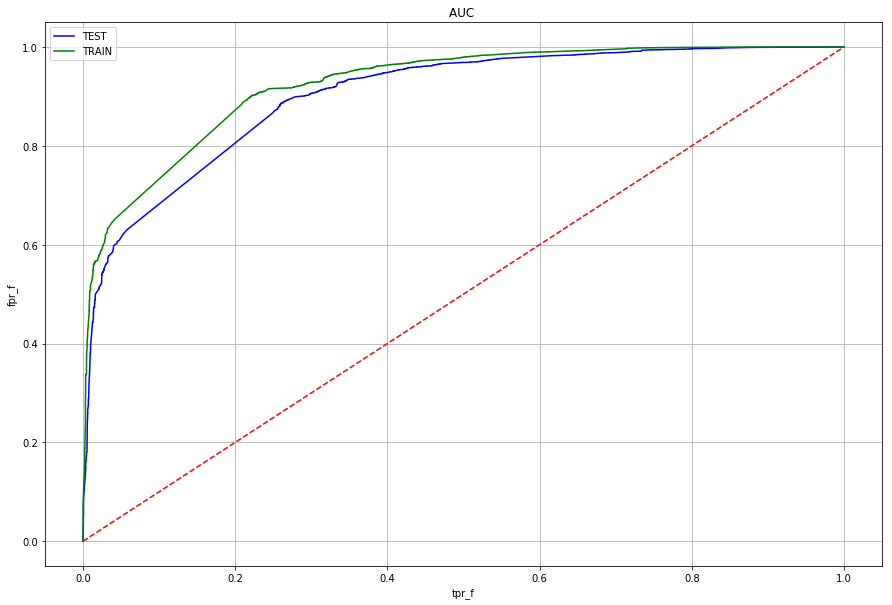

In [204]:
plt.figure(figsize=(15,10))
plt.plot(fpr_f,tpr_f,'b',label='TEST')
plt.plot(x_a,y_a,'--r')
plt.plot(fpr_ft,tpr_ft,'g',label='TRAIN')
plt.xlabel('tpr_f')
plt.ylabel('fpr_f')
plt.title('AUC ')
plt.grid()
plt.legend()
plt.show()

### CONFUSION MATRIX

In [205]:
pred_final
pred_train
pred_final_classte=[]
pred_final_classtr=[]
for i in range(len(pred_final)):
    if pred_final[i]>0.5:
        pred_final_classte.append(1)
    elif pred_final[i]<=0.5:
            pred_final_classte.append(0)
for i in range(len(pred_train)):
    if pred_train[i]>0.5:
        pred_final_classtr.append(1)
    elif pred_train[i]<=0.5:
            pred_final_classtr.append(0)

### TEST

In [206]:
cm = confusion_matrix(y_test, pred_final_classte)
cm

array([[    1,  4556],
       [    0, 21775]], dtype=int64)

In [207]:
y_test["Score"].value_counts()

1    21775
0     4557
Name: Score, dtype: int64

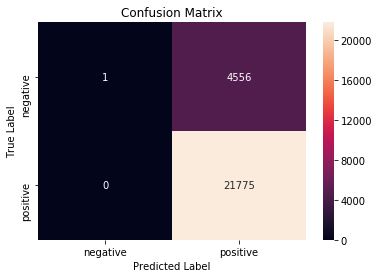

In [208]:
import seaborn as sns
class_label = ["negative", "positive"]
df_cm = pd.DataFrame(cm, index = class_label, columns = class_label)
sns.heatmap(df_cm, annot = True, fmt = "d")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

### TRAIN

In [209]:
cm = confusion_matrix(y_tr, pred_final_classtr)
cm

array([[    2,  6357],
       [    0, 36649]], dtype=int64)

In [210]:
y_tr["Score"].value_counts()

1    36649
0     6359
Name: Score, dtype: int64

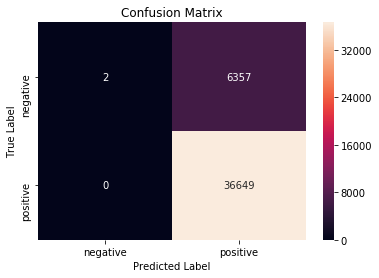

In [211]:
import seaborn as sns
class_label = ["negative", "positive"]
df_cm = pd.DataFrame(cm, index = class_label, columns = class_label)
sns.heatmap(df_cm, annot = True, fmt = "d")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

## CONCLUSION

In [212]:
from sklearn.metrics import classification_report
print(classification_report(y_test, pred_final_classte))

              precision    recall  f1-score   support

           0       1.00      0.00      0.00      4557
           1       0.83      1.00      0.91     21775

   micro avg       0.83      0.83      0.83     26332
   macro avg       0.91      0.50      0.45     26332
weighted avg       0.86      0.83      0.75     26332



## [3] REVIEW TEXT WITH SUMMARY TEXT 

In [213]:
from scipy.sparse import hstack,coo_matrix
prepro_tr_d=[]
for i in range(len(prepro_tr)):
    prepro_tr_d.append(prepro_tr[i]+" "+prepro_tr_sum[i])
    
prepro_cv_d=[]
for i in range(len(prepro_cv)):
    prepro_cv_d.append(prepro_cv[i]+' '+prepro_cv_sum[i])
    
prepro_test_d=[]
for i in range(len(prepro_test)):
    prepro_test_d.append(prepro_test[i]+' '+prepro_test_sum[i])
    



In [214]:
#BoW
count_vect = CountVectorizer() #in scikit-learn
count_vect.fit(prepro_tr)
print("some feature names ", count_vect.get_feature_names()[:10])
print('='*50)

final_counts = count_vect.fit_transform(prepro_tr_d)
print("the type of count vectorizer ",type(final_counts))
print("the shape of out text BOW vectorizer ",final_counts.get_shape())
print("the number of unique words ", final_counts.get_shape()[1])

some feature names  ['aa', 'aaa', 'aaaa', 'aaaaaaaaaaaaaaa', 'aaaaaaarrrrrggghhh', 'aaaaah', 'aaaah', 'aaaand', 'aachen', 'aadp']
the type of count vectorizer  <class 'scipy.sparse.csr.csr_matrix'>
the shape of out text BOW vectorizer  (43008, 40137)
the number of unique words  40137


### FOR CV DATA

In [215]:
#BoW
final_counts_cv = count_vect.transform(prepro_cv_d)
print("the type of count vectorizer ",type(final_counts_cv))
print("the shape of out text BOW vectorizer ",final_counts_cv.get_shape())
print("the number of unique words ", final_counts_cv.get_shape()[1])

the type of count vectorizer  <class 'scipy.sparse.csr.csr_matrix'>
the shape of out text BOW vectorizer  (18433, 40137)
the number of unique words  40137


### FOR TEST DATA

In [216]:
#BoW

final_counts_test = count_vect.transform(prepro_test_d)
print("the type of count vectorizer ",type(final_counts_test))
print("the shape of out text BOW vectorizer ",final_counts_test.get_shape())
print("the number of unique words ", final_counts_test.get_shape()[1])

the type of count vectorizer  <class 'scipy.sparse.csr.csr_matrix'>
the shape of out text BOW vectorizer  (26332, 40137)
the number of unique words  40137


### Applying Random Forests on BOW

In [146]:
from sklearn.ensemble import RandomForestClassifier as rfc
import seaborn as sns

In [147]:
auc_cv=[]
tpr_cv=[]
fpr_cv=[]
tpr_tr=[]
fpr_tr=[]
auc_tr=[]
data_rec=[]
data_rec=[]
hypermeter=[]
n_est = [5, 10, 50, 100, 200, 500, 1000]
max_dep = [2, 3, 5, 7,10, 12, 15, 20]
for i in n_est:
    for j in max_dep:
        clf=rfc(n_estimators=i,max_depth=j)
        clf.fit(final_counts,y_tr)
        pred = clf.predict_proba(final_counts_cv)[:,1]
        fpr, tpr, thresholds = metrics.roc_curve(y_cv, pred)
        auc=metrics.auc(fpr, tpr)
        auc_cv.append(auc)
        tpr_cv.append(tpr)
        fpr_cv.append(fpr)

        # predict the response on the train
        pred = clf.predict_proba(final_counts)[:,1]
        fpr, tpr, thresholds = metrics.roc_curve(y_tr, pred)
        auc=metrics.auc(fpr, tpr)
        auc_tr.append(auc)
        tpr_tr.append(tpr)
        fpr_tr.append(fpr)
        hypermeter.append([i,j])
        print(i,j)

C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



5 2


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



5 3


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



5 5


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



5 7


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



5 10


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



5 12


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



5 15


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



5 20


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



10 2


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



10 3


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



10 5


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



10 7


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



10 10


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



10 12


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



10 15


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



10 20


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



50 2


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



50 3


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



50 5


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



50 7


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



50 10


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



50 12


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



50 15


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



50 20


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



100 2


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



100 3


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



100 5


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



100 7


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



100 10


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



100 12


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



100 15


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



100 20


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



200 2


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



200 3


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



200 5


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



200 7


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



200 10


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



200 12


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



200 15


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



200 20


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



500 2


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



500 3


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



500 5


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



500 7


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



500 10


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



500 12


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



500 15


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



500 20


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



1000 2


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



1000 3


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



1000 5


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



1000 7


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



1000 10


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



1000 12


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



1000 15


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



1000 20


In [148]:
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
import numpy as np

In [149]:
dep=[]
n_est=[]
for i in range(len(hypermeter)):
    n_est.append(hypermeter[i][0])
    dep.append(hypermeter[i][1])  

In [150]:
data1={'n_est':n_est,'dep':dep,'auc_cv':auc_cv[:],'auc_tr':auc_tr[:]}
data_f=pd.DataFrame(data1)

<h1>N_ESTIMATORS VS MAX_DEPTH</h1>

#### FOR TRAIN 

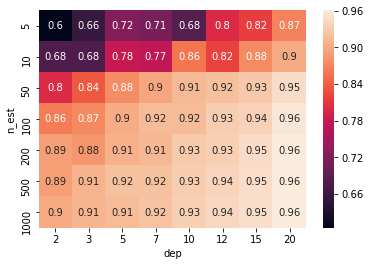

In [151]:
plo = data_f.pivot("n_est", "dep", "auc_tr");ax = sns.heatmap(plo, annot=True)

<h4 color='red'>FOR CV</h4>

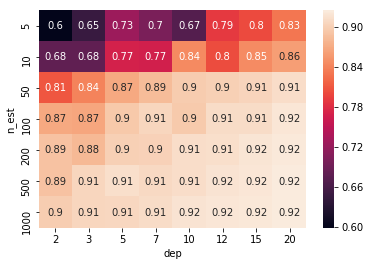

In [152]:
plo = data_f.pivot("n_est", "dep", "auc_cv");ax = sns.heatmap(plo, annot=True)

In [217]:
# TESTING THE MODEL ON TEST DATA

clf_final = rfc(n_estimators=100,max_depth=20)
clf_final.fit(final_counts, y_tr)
pred_final = clf_final.predict_proba(final_counts_test)[:,1]
fpr_f, tpr_f, thresholds_f = metrics.roc_curve(y_test, pred_final)
auc_final = metrics.auc(fpr_f, tpr_f)
auc_final


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



0.9217930401670686

In [218]:
# TESTING THE MODEL ON TRAIN DATA

pred_train=clf_final.predict_proba(final_counts)[:,1]
fpr_ft, tpr_ft, thresholds_ft=metrics.roc_curve(y_tr, pred_train)
auc_finalt=metrics.auc(fpr_ft, tpr_ft)
auc_finalt

0.9576475755041951

### ROC CURVE

In [219]:
y_a=[0,0.5,1]
x_a=y_a

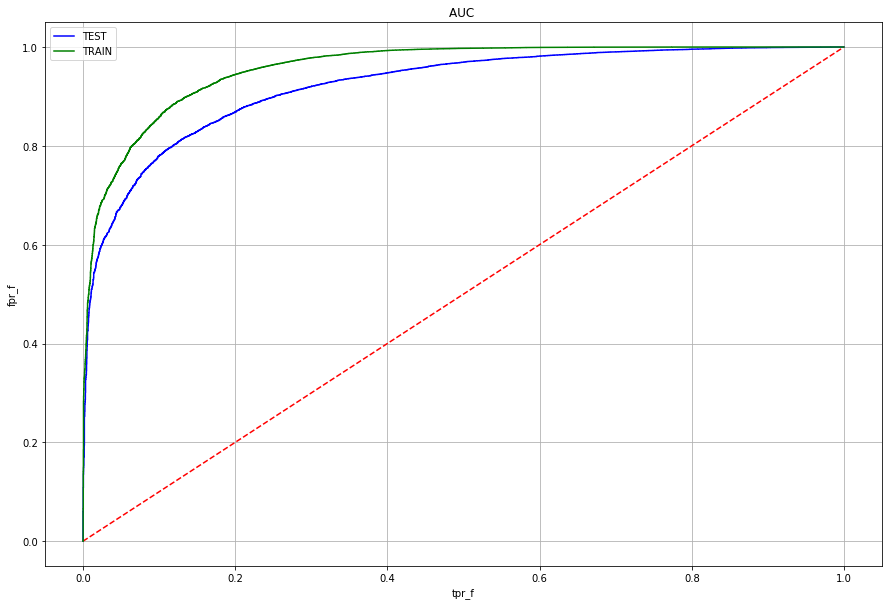

In [220]:
plt.figure(figsize=(15,10))
plt.plot(fpr_f,tpr_f,'b',label='TEST')
plt.plot(x_a,y_a,'--r')
plt.plot(fpr_ft,tpr_ft,'g',label='TRAIN')
plt.xlabel('tpr_f')
plt.ylabel('fpr_f')
plt.title('AUC ')
plt.grid()
plt.legend()
plt.show()

### CONFUSION MATRIX

In [221]:
pred_final
pred_train
pred_final_classte=[]
pred_final_classtr=[]
for i in range(len(pred_final)):
    if pred_final[i]>0.5:
        pred_final_classte.append(1)
    elif pred_final[i]<=0.5:
            pred_final_classte.append(0)
for i in range(len(pred_train)):
    if pred_train[i]>0.5:
        pred_final_classtr.append(1)
    elif pred_train[i]<=0.5:
            pred_final_classtr.append(0)

### TEST

In [222]:
cm = confusion_matrix(y_test, pred_final_classte)
cm

array([[    1,  4556],
       [    0, 21775]], dtype=int64)

In [223]:
y_test["Score"].value_counts()

1    21775
0     4557
Name: Score, dtype: int64

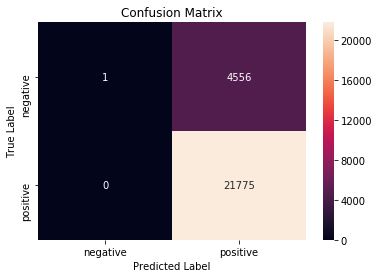

In [224]:
import seaborn as sns
class_label = ["negative", "positive"]
df_cm = pd.DataFrame(cm, index = class_label, columns = class_label)
sns.heatmap(df_cm, annot = True, fmt = "d")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

### TRAIN

In [225]:
cm = confusion_matrix(y_tr, pred_final_classtr)
cm

array([[   59,  6300],
       [    0, 36649]], dtype=int64)

In [226]:
y_tr["Score"].value_counts()

1    36649
0     6359
Name: Score, dtype: int64

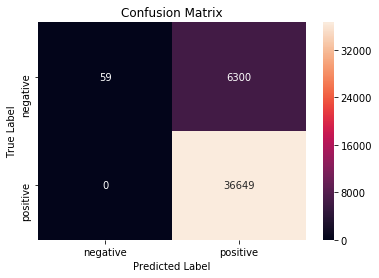

In [227]:
import seaborn as sns
class_label = ["negative", "positive"]
df_cm = pd.DataFrame(cm, index = class_label, columns = class_label)
sns.heatmap(df_cm, annot = True, fmt = "d")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

## CONCLUSION

In [228]:
from sklearn.metrics import classification_report
print(classification_report(y_test, pred_final_classte))

              precision    recall  f1-score   support

           0       1.00      0.00      0.00      4557
           1       0.83      1.00      0.91     21775

   micro avg       0.83      0.83      0.83     26332
   macro avg       0.91      0.50      0.45     26332
weighted avg       0.86      0.83      0.75     26332



## [3]REVIEW TEXT ,SUMMARY TEXT AND LENGTH OF REVIEW

In [264]:
from scipy.sparse import hstack,coo_matrix
prepro_tr_d=[]
for i in range(len(prepro_tr)):
    prepro_tr_d.append(prepro_tr[i]+" "+prepro_tr_sum[i])
    
prepro_cv_d=[]
for i in range(len(prepro_cv)):
    prepro_cv_d.append(prepro_cv[i]+' '+prepro_cv_sum[i])
    
prepro_test_d=[]
for i in range(len(prepro_test)):
    prepro_test_d.append(prepro_test[i]+' '+prepro_test_sum[i])
    



In [265]:
#BoW
count_vect = CountVectorizer() #in scikit-learn
count_vect.fit(prepro_tr_d)
print("some feature names ", count_vect.get_feature_names()[:10])
print('='*50)

final_counts = count_vect.fit_transform(prepro_tr_d)
print("the type of count vectorizer ",type(final_counts))
print("the shape of out text BOW vectorizer ",final_counts.get_shape())
print("the number of unique words ", final_counts.get_shape()[1])

some feature names  ['aa', 'aaa', 'aaaa', 'aaaaaaaaaaaa', 'aaaaaaaaaaaaaaa', 'aaaaaaarrrrrggghhh', 'aaaaaagh', 'aaaaah', 'aaaah', 'aaaand']
the type of count vectorizer  <class 'scipy.sparse.csr.csr_matrix'>
the shape of out text BOW vectorizer  (43008, 40137)
the number of unique words  40137


### FOR CV DATA

In [266]:
#BoW
final_counts_cv = count_vect.transform(prepro_cv_d)
print("the type of count vectorizer ",type(final_counts_cv))
print("the shape of out text BOW vectorizer ",final_counts_cv.get_shape())
print("the number of unique words ", final_counts_cv.get_shape()[1])

the type of count vectorizer  <class 'scipy.sparse.csr.csr_matrix'>
the shape of out text BOW vectorizer  (18433, 40137)
the number of unique words  40137


### FOR TEST DATA

In [267]:
#BoW

final_counts_test = count_vect.transform(prepro_test_d)
print("the type of count vectorizer ",type(final_counts_test))
print("the shape of out text BOW vectorizer ",final_counts_test.get_shape())
print("the number of unique words ", final_counts_test.get_shape()[1])

the type of count vectorizer  <class 'scipy.sparse.csr.csr_matrix'>
the shape of out text BOW vectorizer  (26332, 40137)
the number of unique words  40137


In [278]:
hstack((final_counts, pd.Series(length[:43008])[:,None]))

<43008x40138 sparse matrix of type '<class 'numpy.int64'>'
	with 1516481 stored elements in COOrdinate format>

In [280]:
hstack((final_counts_cv, pd.Series(length[43008:61441])[:,None]))


<18433x40138 sparse matrix of type '<class 'numpy.int64'>'
	with 651226 stored elements in COOrdinate format>

In [281]:
hstack((final_counts_test, pd.Series(length[61441:])[:,None]))

<26332x40138 sparse matrix of type '<class 'numpy.int64'>'
	with 933701 stored elements in COOrdinate format>

### Applying Random Forests on BOW

In [282]:
from sklearn.ensemble import RandomForestClassifier as rfc
import seaborn as sns

In [283]:
auc_cv=[]
tpr_cv=[]
fpr_cv=[]
tpr_tr=[]
fpr_tr=[]
auc_tr=[]
data_rec=[]
data_rec=[]
hypermeter=[]
n_est = [5, 10, 50, 100, 200, 500, 1000]
max_dep = [2, 3, 5, 7,10, 12, 15, 20]
for i in n_est:
    for j in max_dep:
        clf=rfc(n_estimators=i,max_depth=j)
        clf.fit(final_counts,y_tr)
        pred = clf.predict_proba(final_counts_cv)[:,1]
        fpr, tpr, thresholds = metrics.roc_curve(y_cv, pred)
        auc=metrics.auc(fpr, tpr)
        auc_cv.append(auc)
        tpr_cv.append(tpr)
        fpr_cv.append(fpr)

        # predict the response on the train
        pred = clf.predict_proba(final_counts)[:,1]
        fpr, tpr, thresholds = metrics.roc_curve(y_tr, pred)
        auc=metrics.auc(fpr, tpr)
        auc_tr.append(auc)
        tpr_tr.append(tpr)
        fpr_tr.append(fpr)
        hypermeter.append([i,j])
        print(i,j)

C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



5 2


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



5 3


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



5 5


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



5 7


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



5 10


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



5 12


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



5 15


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



5 20


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



10 2


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



10 3


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



10 5


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



10 7


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



10 10


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



10 12


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



10 15


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



10 20


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



50 2


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



50 3


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



50 5


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



50 7


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



50 10


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



50 12


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



50 15


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



50 20


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



100 2


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



100 3


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



100 5


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



100 7


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



100 10


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



100 12


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



100 15


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



100 20


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



200 2


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



200 3


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



200 5


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



200 7


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



200 10


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



200 12


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



200 15


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



200 20


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



500 2


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



500 3


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



500 5


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



500 7


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



500 10


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



500 12


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



500 15


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



500 20


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



1000 2


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



1000 3


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



1000 5


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



1000 7


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



1000 10


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



1000 12


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



1000 15


C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



1000 20


In [284]:
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
import numpy as np

In [285]:
dep=[]
n_est=[]
for i in range(len(hypermeter)):
    n_est.append(hypermeter[i][0])
    dep.append(hypermeter[i][1])  

In [286]:
data1={'n_est':n_est,'dep':dep,'auc_cv':auc_cv[:],'auc_tr':auc_tr[:]}
data_f=pd.DataFrame(data1)

<h1>N_ESTIMATORS VS MAX_DEPTH</h1>

#### FOR TRAIN 

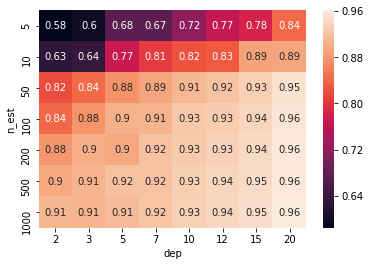

In [287]:
plo = data_f.pivot("n_est", "dep", "auc_tr");ax = sns.heatmap(plo, annot=True)

<h4 color='red'>FOR CV</h4>

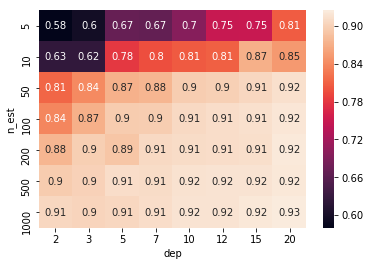

In [288]:
plo = data_f.pivot("n_est", "dep", "auc_cv");ax = sns.heatmap(plo, annot=True)

In [301]:
# TESTING THE MODEL ON TEST DATA

clf_final = rfc(n_estimators=1000,max_depth=20)
clf_final.fit(final_counts, y_tr)
pred_final = clf_final.predict_proba(final_counts_test)[:,1]
fpr_f, tpr_f, thresholds_f = metrics.roc_curve(y_test, pred_final)
auc_final = metrics.auc(fpr_f, tpr_f)
auc_final



C:\Users\Ankit Mishra\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



0.9246402866913219

In [302]:
# TESTING THE MODEL ON TRAIN DATA

pred_train=clf_final.predict_proba(final_counts)[:,1]
fpr_ft, tpr_ft, thresholds_ft=metrics.roc_curve(y_tr, pred_train)
auc_finalt=metrics.auc(fpr_ft, tpr_ft)
auc_finalt

0.9609029210264117

### ROC CURVE

In [303]:
y_a=[0,0.5,1]
x_a=y_a

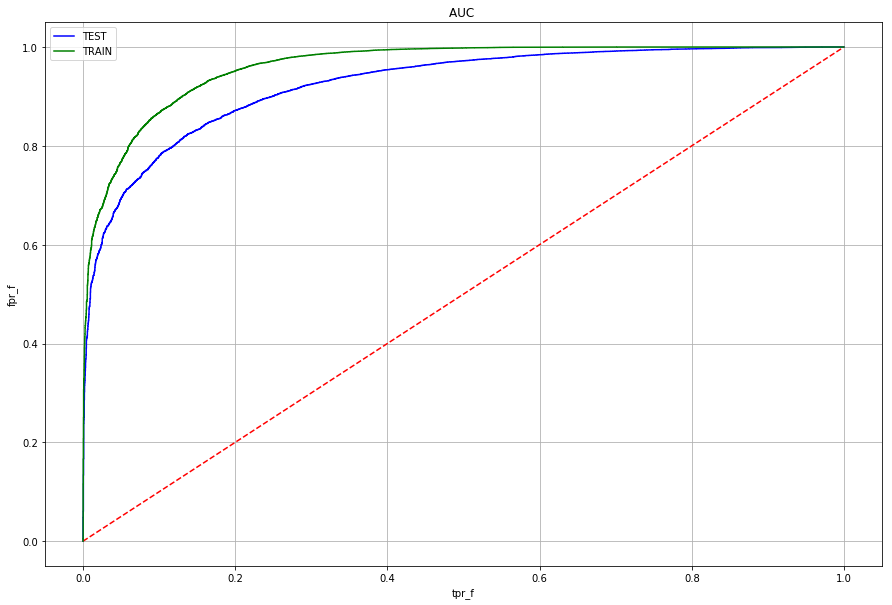

In [304]:
plt.figure(figsize=(15,10))
plt.plot(fpr_f,tpr_f,'b',label='TEST')
plt.plot(x_a,y_a,'--r')
plt.plot(fpr_ft,tpr_ft,'g',label='TRAIN')
plt.xlabel('tpr_f')
plt.ylabel('fpr_f')
plt.title('AUC ')
plt.grid()
plt.legend()
plt.show()

### CONFUSION MATRIX

In [305]:
pred_final
pred_train
pred_final_classte=[]
pred_final_classtr=[]
for i in range(len(pred_final)):
    if pred_final[i]>0.5:
        pred_final_classte.append(1)
    elif pred_final[i]<=0.5:
            pred_final_classte.append(0)
for i in range(len(pred_train)):
    if pred_train[i]>0.5:
        pred_final_classtr.append(1)
    elif pred_train[i]<=0.5:
            pred_final_classtr.append(0)

### TEST

In [306]:
cm = confusion_matrix(y_test, pred_final_classte)
cm

array([[    1,  4556],
       [    0, 21775]], dtype=int64)

In [307]:
y_test["Score"].value_counts()

1    21775
0     4557
Name: Score, dtype: int64

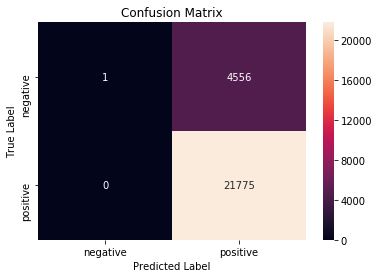

In [308]:
import seaborn as sns
class_label = ["negative", "positive"]
df_cm = pd.DataFrame(cm, index = class_label, columns = class_label)
sns.heatmap(df_cm, annot = True, fmt = "d")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

### TRAIN

In [309]:
cm = confusion_matrix(y_tr, pred_final_classtr)
cm

array([[   48,  6311],
       [    0, 36649]], dtype=int64)

In [310]:
y_tr["Score"].value_counts()

1    36649
0     6359
Name: Score, dtype: int64

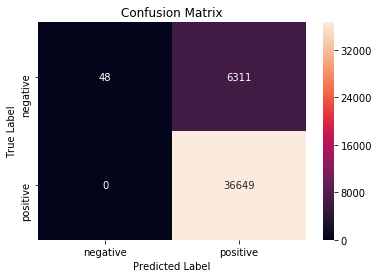

In [311]:
import seaborn as sns
class_label = ["negative", "positive"]
df_cm = pd.DataFrame(cm, index = class_label, columns = class_label)
sns.heatmap(df_cm, annot = True, fmt = "d")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

## CONCLUSION

In [312]:
from sklearn.metrics import classification_report
print(classification_report(y_test, pred_final_classte))

              precision    recall  f1-score   support

           0       1.00      0.00      0.00      4557
           1       0.83      1.00      0.91     21775

   micro avg       0.83      0.83      0.83     26332
   macro avg       0.91      0.50      0.45     26332
weighted avg       0.86      0.83      0.75     26332



In [3]:
from prettytable import PrettyTable
    
x = PrettyTable()
   
x.field_names = ["FEATURES","VECTORIZER",'ALGO','N_ESTIMATORS','MAX_DEPTH', "AUC"]
x.add_row(['REVIEW TEXTS',"BOW",'RANDOM FOREST',100,20,0.8898103597573987])
x.add_row(['SUMMARY TEXTS',"BOW",'RANDOM FOREST',100,20,0.9016161860470271])
x.add_row(['REVIEW AND SUMMARY TEXTS',"BOW",'RANDOM FOREST',100,20,0.9217930401670686])
x.add_row(['REVIEW TEXTS, SUMMARY TEXTS AND REVIEW LENGTH',"BOW",'RANDOM FOREST',1000,20,0.9246402866913219])

In [4]:
print(x)

+-----------------------------------------------+------------+---------------+--------------+-----------+--------------------+
|                    FEATURES                   | VECTORIZER |      ALGO     | N_ESTIMATORS | MAX_DEPTH |        AUC         |
+-----------------------------------------------+------------+---------------+--------------+-----------+--------------------+
|                  REVIEW TEXTS                 |    BOW     | RANDOM FOREST |     100      |     20    | 0.8898103597573987 |
|                 SUMMARY TEXTS                 |    BOW     | RANDOM FOREST |     100      |     20    | 0.9016161860470271 |
|            REVIEW AND SUMMARY TEXTS           |    BOW     | RANDOM FOREST |     100      |     20    | 0.9217930401670686 |
| REVIEW TEXTS, SUMMARY TEXTS AND REVIEW LENGTH |    BOW     | RANDOM FOREST |     1000     |     20    | 0.9246402866913219 |
+-----------------------------------------------+------------+---------------+--------------+-----------+------